In [1]:
!unzip trainingsdata.zip

Archive:  trainingsdata.zip
  inflating: y_train.npy             
  inflating: y_val.npy               
  inflating: X_test.csv              
  inflating: X_train.csv             
  inflating: X_val.csv               
  inflating: y_test.npy              


In [2]:
!unzip data.zip

Archive:  data.zip
  inflating: lda_train.npy           
  inflating: lda_val.npy             
  inflating: X_test_ft_avg.npy       
  inflating: X_test_ft_usif.npy      
  inflating: X_test_glove_avg.npy    
  inflating: X_test_glove_usif.npy   
  inflating: X_train_ft_avg.npy      
  inflating: X_train_ft_usif.npy     
  inflating: X_train_glove_avg.npy   
  inflating: X_train_glove_usif.npy  
  inflating: X_val_ft_avg.npy        
  inflating: X_val_ft_usif.npy       
  inflating: X_val_glove_avg.npy     
  inflating: X_val_glove_usif.npy    
  inflating: lda_test.npy            


# Imports
Here the imports are listed, which are important for the model

In [6]:
!pip install gensim
!pip install -U git+https://github.com/oborchers/Fast_Sentence_Embeddings

  Cloning https://github.com/oborchers/Fast_Sentence_Embeddings to /tmp/pip-req-build-1ay5f8vw
  Running command git clone -q https://github.com/oborchers/Fast_Sentence_Embeddings /tmp/pip-req-build-1ay5f8vw
     |████████████████████████████████| 24.2 MB 93 kB/s 
     |████████████████████████████████| 56.8 MB 25 kB/s 
  Using cached Cython-0.29.14-cp37-cp37m-manylinux1_x86_64.whl (2.1 MB)
     |████████████████████████████████| 168 kB 72.0 MB/s 
     |████████████████████████████████| 721 kB 38.7 MB/s 
  Created wheel for fse: filename=fse-0.1.16-cp37-cp37m-linux_x86_64.whl size=656713 sha256=81c900be5d5adc9ca7d4c4c6e0da9b7391c4c42f58f9798597b7b99a060e1672
  Stored in directory: /tmp/pip-ephem-wheel-cache-l9vcaw8s/wheels/2a/d4/e6/644ae9126bf0fd4d3c5059e5b49d2728e080b2dc389cad953b
  Created wheel for wordfreq: filename=wordfreq-2.5.0-py3-none-any.whl size=56830860 sha256=6eacde4aed5c33daddc6c918ce421a19f314735bde5f3871f9a87f570641d08d
  Stored in directory: /root/.cache/pip/wheels/2f/

In [7]:
import numpy
import sklearn
from sklearn import metrics
from sklearn.model_selection import KFold
import tensorflow as tf
#from tensorflow.keras.layers.experimental import preprocessing
from tensorflow import keras
import keras.backend as K
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import pandas as pd
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization
from sklearn.decomposition import NMF, LatentDirichletAllocation

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import tensorflow_hub as hub

#logger
import logging
logger = logging.getLogger()
logger.setLevel(logging.INFO)

#type annotation
from typing import *
tf.get_logger().setLevel('ERROR')

import gc
gc.enable()

#vocab_size = 20000
#sequence_length = 500#200
#AUTOTUNE = tf.data.AUTOTUNE
SEED = 100
#embedding_dim = 128
from tensorflow.keras.layers import Embedding

## Vectorisation (if needed)

### Bow vectoriser and Sentence encoder

In [2]:
def getVectoriser(kind:str = "tfIdf", vocab=512, ngram_range=(1,1), trainingsData=None):
  """
  This function creates the vectoriser according to the parameter and returns it.
  It can be either a count, tfIdf or sentence vectoriser
  """
  global vectoriser_func
  if kind is "tfIdf":
    vectoriser = TfidfVectorizer(lowercase=True, min_df=2, max_features=vocab, ngram_range=ngram_range, stop_words="english")
    trainVectoriser(vectoriser, trainingsData)
    return vectoriser
  elif kind is "count":
    vectoriser = CountVectorizer(lowercase=True, min_df=2, max_features=vocab, ngram_range=ngram_range, stop_words="english")
    trainVectoriser(vectoriser, trainingsData)
    return vectoriser
  elif kind is "sentence":
    return hub.KerasLayer("https://tfhub.dev/google/universal-sentence-encoder/4")


def trainVectoriser(vectoriser, trainingsData):
  """
  This function is used to train the vectoriser
  """
  text_ds = trainingsData.flatten()
  tmp = vectoriser.fit_transform(text_ds)
  logger.info(tmp.shape)
  del text_ds, tmp
  gc.collect()

def batchVectorisation(dfData, vectoriser, kindOfvectoriser):
  """
  This function loads the data in batches to reduce RAM requirenments
  """
  #print(kindOfvectoriser)
  if kindOfvectoriser is "sentence":
    vecFunc = lambda string: vectoriser(tf.constant(string)) 
  else:
    vecFunc = lambda string: vectoriser.transform(string).toarray()
  l = dfData[:,0]
  r = dfData[:,1]
  returnValue = [[],[]]
  batch_size = 250
  while len(l) >0 :
    le = vecFunc(l[:batch_size]) #vectoriser.transform(l[:batch_size]).toarray()
    re = vecFunc(r[:batch_size]) #vectoriser.transform(r[:batch_size]).toarray()

    if len(returnValue[0]) == 0:
      returnValue[0] = le
      returnValue[1] = re
    else:
      returnValue[0] = numpy.concatenate((returnValue[0], le), axis=0)
      returnValue[1] = numpy.concatenate((returnValue[1], re), axis=0)

    l = l[batch_size:]
    r = r[batch_size:]
    logger.info(f"{returnValue[0].shape} todo {l.shape}")
  return returnValue

def vectoriseData(vectoriser, training, validation, kind = "tfidf"):
  """
  This function vectorises the data provided given the vectoriser provided
  """
  X_train_list = batchVectorisation(training, vectoriser, kind)
  X_val_list = batchVectorisation(validation, vectoriser, kind)
  return X_train_list, X_val_list

### GloVe; Fasttext usif and avg document embeddings

In [3]:
from gensim.models import Word2Vec, FastText
!pip install -U fse
from fse.models.average import FAST_VERSION
print(FAST_VERSION) #1 means available
from fse.models import Average, uSIF
import gensim.downloader as api
from fse import IndexedList

class EmbeddingModels():
  """
  This class is used to create a Embedding model, which is able to vectorise documents
  """
  def __init__(self, vocab_len, trainingsdata, embedName, combiName):
    self.tokenizer = TfidfVectorizer(lowercase=True, min_df=2, max_features=vocab_len, ngram_range=(1,1), stop_words="english").build_tokenizer()
    tokdata = self.tokenize(trainingsdata)

    self.embed = self.get_embedding(tokdata, embedName, vocab_len)
    logger.error("got embedding")

    tokdata = IndexedList(tokdata)
    logger.error("csp")

    self.model = self.getMergingMethod(combiName, self.embed, embedName, vocab_len)
    logger.error("got combi")
    self.model.train(tokdata)
    logger.error("finished training")
  
  def getMergingMethod(self, combiName, embedding, embedName, voc_len):
    if combiName is "avg":
      return Average(embedding)
    else:
      if embedName is "glove":
        return uSIF(embedding, workers=2, lang_freq="en")
      else:
        return uSIF(embedding, length=voc_len)

  def get_embedding(self, trainingsdata, embedName, vocab_len):
    if embedName is "glove":
      return api.load("glove-wiki-gigaword-100")
    elif embedName is "fasttext":
      return FastText(window=3, min_count=1, sentences=trainingsdata, size=vocab_len)
    else:
      return Word2Vec(trainingsdata, min_count=1, size=vocab_len)

  def tokenize(self, data):
    return [self.tokenizer(doc) for doc in data]

  def predict(self, data):
    """
    This function returns the document embeddings of the data provided
    """
    tokenized_data = self.tokenize(data)
    idxTok = IndexedList(tokenized_data)
    inf_tokens = list(map(lambda tokenList: (tokenList, 0), tokenized_data))
    #print(numpy.array(inf_tokens))
    return list(map(lambda inf_data: self.model.infer([inf_data])[0], inf_tokens))

/usr/local/lib/python3.7/dist-packages/gensim/similarities/__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


  Using cached gensim-3.8.3-cp37-cp37m-manylinux1_x86_64.whl (24.2 MB)
  Attempting uninstall: gensim
    Found existing installation: gensim 4.0.1
    Uninstalling gensim-4.0.1:
      Successfully uninstalled gensim-4.0.1


ImportError: ignored

## LDA

In [ ]:
class NumberNormalizingVectorizer(TfidfVectorizer):
  """
  This class creates a custom vectoriser used for the LDA.
  """
  def build_tokenizer(self):
    tokenize = super().build_tokenizer()
    return lambda doc: list(self.number_normalizer(tokenize(doc)))

  def number_normalizer(self, tokens):
    return ("NUMBER" if token[0].isdigit() else token for token in tokens)

class GenerateLdaTopics():
  """
  This Class is used to generate the LDA
  """
  def __init__(self, _n_topics=200):
    self.n_topics = _n_topics
    self.cv = NumberNormalizingVectorizer(lowercase=True, min_df=5, max_features=20000, max_df=0.5, stop_words="english",token_pattern='[a-zA-Z]+')
    self.lda = LatentDirichletAllocation(n_components=_n_topics, random_state=0,n_jobs=-1)
    self.vocab = None
    
  def fit(self, data):
    vectorised_data = self.cv.fit_transform(X_train.flatten())
    logger.info("data vectorised")
    self.vocab = self.cv.get_feature_names()
    logger.info("fitting lda")
    self.lda.fit(vectorised_data)

  def predict(self, data):
    vec_data = self.cv.transform(data)     #document-term matrix
    return self.lda.transform(vec_data)    #document-topic matrix

  def print_topics(self,n_top_words=5):
    for topic, comp in enumerate(self.lda.components_):  #iterate through the topic-term matrix
      word_idx = numpy.argsort(comp)[:-n_top_words-1:-1]
      words = [self.vocab[i] for i in word_idx]
      print('Topic: %d' % topic)
      print('  %s' % ', '.join(words)) 

  def print_predictedTopics(self, data, n_top_topics = 5):
    pred = self.predict(data)
    topicsAndPropabilities = []
    for p in pred:    #for document in document-topic
      top_topics = p.argsort()[:-n_top_topics - 1:-1]
      propabilities = p[top_topics]
      topicsAndPropabilities.append([top_topics, propabilities])#print k best topics
    return topicsAndPropabilities

#The classifier

In [4]:
class LayerAppendSum(tf.keras.layers.Layer):
  """
  This function returns the vector with one extra dimmension for its sum.
  """
  def __init__(self):
      super(LayerAppendSum, self).__init__()

  def call(self, inputs):
    def mapfunc(vec):
      reduced_sum = tf.reduce_sum(vec)
      reshaped = tf.reshape(reduced_sum, [-1])
      return tf.concat([vec, reshaped], 0)
    return tf.map_fn(lambda batch: mapfunc(batch), inputs)  #tf.concat([inputs, reduced])


# Create a Dense model
def createModel(vec_len):
  ain = keras.Input(shape=(vec_len,), dtype="float")
  bin = keras.Input(shape=(vec_len,), dtype="float")
  #x = keras.Input(shape=(200,), dtype="float")
  #y = keras.Input(shape=(200,), dtype="float")

  a = tf.keras.layers.Lambda(lambda x: K.l2_normalize(x,axis=0))(ain)
  b = tf.keras.layers.Lambda(lambda x: K.l2_normalize(x,axis=0))(bin)

  avg_layer = tf.keras.layers.Average(name="avg")([a, b])
  mult_layer = tf.keras.layers.Multiply(name="mult")([a,b])
  sub_layer = tf.keras.layers.Subtract(name="sub")([a, b])

  cosine_sim = tf.keras.layers.Dot(axes=1, normalize=True, name="cosine_similarity")([a,b])
  #topic_sim = tf.keras.layers.Dot(axes=1, normalize=True, name="topic_similarity")([x,y])

  #avg_layer = LayerAppendSum()(avg_layer)
  #mult_layer = LayerAppendSum()(mult_layer)
  #sub_layer = LayerAppendSum()(sub_layer)

  hidden = tf.keras.layers.concatenate([a,b, sub_layer, avg_layer, mult_layer,cosine_sim])#, topic_sim]), topic_sim])

  outputs = layers.Dense(5, activation='softmax')(hidden)

  model = keras.Model([ain,bin], outputs)   #,x,y
  model.compile(optimizer="adam", loss="binary_crossentropy", metrics=['accuracy'])
  return model

def download_model(model):
  """
  This function is used to download models from google collab specifficly.
  !tar -czvf model.tar.gz model/ is used for tarring the model
  !tar -xvzf model.tar.gz is used for ent-tarring the model
  """
  model.save(f"./tmp_model")
  !tar -czvf tmp_model.tar.gz tmp_model/
  from google.colab import files
  files.download('tmp_model.tar.gz')

def eval_model(predLabel:List[int], true_label:List[int]):
  """
  This function is used to determine the precision, recall and f1 score of a given model.
  """
  f1_scores = sklearn.metrics.f1_score(y_true=true_label, y_pred=predLabel, average=None)
  precission = sklearn.metrics.precision_score(y_true=true_label, y_pred=predLabel, average=None)
  recall = sklearn.metrics.recall_score(y_true=true_label, y_pred=predLabel, average=None)

  precission = list(map(lambda x: round(x, 4), precission))
  recall = list(map(lambda x: round(x, 4), recall))
  f1 = list(map(lambda x: round(x, 4), f1_scores))
  f1_macro =  round(sum(f1)/len(f1), 4)
  return precission, recall, f1, f1_macro

## Running the model configuration

In [ ]:
#newLda = GenerateLdaTopics()
#newLda.fit(X_train.flatten())

INFO:root:data vectorised
INFO:root:fitting lda


#### Finding the best vectoriser configuration

In [ ]:
def loadTrainAndValFeatures(nameTrainDataset: str, nameValDataset: str) -> list:
  """
  This function loads the train and validation set
  """
  X_train:numpy.ndarray = loadCSVData("X_train")
  X_val:numpy.ndarray = loadCSVData("X_val")

  return X_train, X_val

def loadCSVData(name:str) -> numpy.ndarray:
  return pd.read_csv(f"{name}.csv")[["IssueA", "IssueB"]].values.astype("str")

def loadNpData(name:str)-> numpy.ndarray:
  return numpy.load(name+".npy", allow_pickle=True)

def loadTrainAndValResults(nameTrainDataset: str, nameValDataset: str):
  """
  This function loads the train and validation set class results
  """
  Y_train = loadNpData("y_train")
  Y_val = loadNpData("y_val")
  Y_val = numpy.array([numpy.array(x) for x in Y_val])
  Y_train = numpy.array([numpy.array(x) for x in Y_train])
  return Y_train, Y_val


def getVectorisedDataFromDataset(lda:bool, name:str, lda_name:str = None):
  """
  This function loads a specific X_train and X_val dataset and appends lda if needed. 
  """
  tmp_list = list(loadNpData(name))     #(f"X_train_{name}"))
  #X_val_list = list(loadNpData(f"X_val_{name}"))

  if lda:
    lda_data = list(loadNpData(lda_name))
    #lda_val = list(loadNpData("lda_val"))
    tmp_list.append(lda_data[0])
    tmp_list.append(lda_data[1])
    #X_val_list.append(lda_val[0])
    #X_val_list.append(lda_val[1])

  return tmp_list

def createVectorisedData(name,ngram,voc, lda:bool, X_train, X_val):
  """
  This function creates vectorised data, by creating a vectoriser given the requirenments specified and transforms the data given.
  """
  newLda= None
  vectoriser = getVectoriser(trainingsData=X_train, vocab=voc, kind=name, ngram_range=ngram)
  X_train_list, X_val_list = vectoriseData(vectoriser, X_train, X_val, kind=name)
  if lda:
    newLda = GenerateLdaTopics()
    newLda.fit(X_train.flatten())
    tl = newLda.predict(X_train[:,0])
    tr = newLda.predict(X_train[:,1])
    vl = newLda.predict(X_val[:,0])
    vr = newLda.predict(X_val[:,1])

    X_train_list.append(tl)
    X_train_list.append(tr)
    X_val_list.append(vl)
    X_val_list.append(vr)

  return X_train_list, X_val_list
  
def createAndEvaluateModel(X_train_list, X_val_list, Y_train, Y_val, voc):
  """
  This function creates and evaluates a model
  """
  model = createModel(voc)
  model.fit(x=X_train_list, y=Y_train, batch_size = 25, epochs=25, validation_data=(X_val_list, Y_val))
  eval_result = model.evaluate(X_val_list, Y_val, batch_size=25)

  output = model.predict(X_val_list, batch_size=15)
  output = list(map(numpy.argmax, output))
  y_val_int = list(map(numpy.argmax, Y_val))

  return eval_model(output, y_val_int)


def trainAndEvaluateModel(vectorisedData:bool, config, lda:bool):
  """
  This function creates and evaluates multiple models
  """
  precissions = []
  recalls = []
  f1s = []
  f1_macros = []
  Y_train, Y_val = loadTrainAndValResults("nameTrainDataset", "nameValDataset")
  
  if vectorisedData:
    for name in data_config:
      X_train_list = getVectorisedDataFromDataset(lda, f"X_train_{name}")
      X_val_list = getVectorisedDataFromDataset(lda, f"X_val_{name}")
      voc = len(X_train_list[0][0])

      precission, recall, f1, f1_macro = createAndEvaluateModel(X_train_list, X_val_list, Y_train, Y_val, voc)
      precissions.append(precission)
      recalls.append(recall)
      f1s.append(f1)
      f1_macros.append(f1_macro)
      gc.collect()

  else:
    for name,ngram,voc in config:
      X_train, X_val = loadTrainAndValFeatures("nameTrainDataset", "nameValDataset")
      X_train_list, X_val_list = createVectorisedData(name,ngram,voc, lda, X_train, X_val)

      precission, recall, f1, f1_macro = createAndEvaluateModel(X_train_list, X_val_list, Y_train, Y_val, voc)
      precissions.append(precission)
      recalls.append(recall)
      f1s.append(f1)
      f1_macros.append(f1_macro)
      gc.collect()
  
  npf1_macros = list(map(lambda x: round(x, 4), f1_macros))

  bestIndex = npf1_macros.index(max(npf1_macros))
  bestVecConfig = vectoriser_config[bestIndex]
  #print(f"\nBest model config:\n{bestVecConfig[0]}:{bestVecConfig[1]}:{bestVecConfig[2]} = {max(npf1_macros)}")
  print(f"\nBest model config:\n{bestVecConfig} = {max(npf1_macros)}")
  return bestVecConfig

#### Running the best vectoriser configuration
The best vectoriser vonfiguration for the model is then run on the test dataset for evaluation purposes

In [12]:
def printLatexOutput(output, Y_test_int, name, ngram, voc):
  """
  This function creates a latex formated output to show the f1, precision, recall performances
  """
  output = list(map(numpy.argmax, output))
  precission, recall, f1, f1_macro = eval_model(output, Y_test_int)
  labels = numpy.array(['unrelated', 'duplicate', '<=>', '<=', '=>'])
  rearrange = numpy.array([4,3,2,0,1])
  labels = labels[rearrange]
  precission = numpy.array(precission)[rearrange]
  recall = numpy.array(recall)[rearrange]
  f1 = numpy.array(f1)[rearrange]

  ng = "" if ngram[1] == 1 else "_{,Un+Bigram}"
  output = f"{name}_{{{voc}}}{ng}" + "\t\t"
  for j in range(len(labels)):
    output += f"& {precission[j]} & {recall[j]} "
  print(output + "\\\\")
  output = f"{name}_{{{voc}}}{ng}" + "\t\t"

  print("\nf1 scores\t\t"+ "\t".join(labels) + "\tmacro f1")
  for j in range(len(labels)):
    output += f"& {f1[j]} "
  output += f" & {f1_macro}"
  print(output + "\\\\")

def createBestModel(name,ngram,voc, lda:bool):
  X_train, X_val = loadTrainAndValFeatures("nameTrainDataset", "nameValDataset")
  Y_train, Y_val = loadTrainAndValResults("nameTrainDataset", "nameValDataset")

  vectoriser = getVectoriser(trainingsData=X_train, vocab=voc, kind=name, ngram_range=ngram)
  X_train_list, X_val_list = vectoriseData(vectoriser, X_train, X_val, kind=name)

  if lda:
    X_train_list.append(tl)
    X_train_list.append(tr)
    X_val_list.append(vl)
    X_val_list.append(vr)

  model = createModel(voc)
  model.fit(x=X_train_list, y=Y_train, batch_size = 25, epochs=25, validation_data=(X_val_list, Y_val))

  del X_train, X_val, Y_train, Y_val

  x_test:numpy.ndarray = loadCSVData("X_test") 
  y_test:numpy.ndarray = loadNpData("y_test")

  X_test: List[numpy.ndarray] = batchVectorisation(x_test, vectoriser, name)#[test_dev[:,0],test_dev[:,1]]### list of numpy.ndarray[str]#
  if lda:
    tsl = newLda.predict(x_test[:,0])
    tsr = newLda.predict(x_test[:,1])
    X_test.append(tsl)
    X_test.append(tsr)

  Y_test_int:numpy.ndarray = numpy.array([numpy.argmax(numpy.array(tmp)) for tmp in y_test])
  gc.collect()

  output = model.predict(X_test, batch_size=15)
  printLatexOutput(output, Y_test_int, name, ngram, voc)
 
  


vectoriser_config = [("count", (1,1), 512), ("tfIdf", (1,1), 512), ("count", (1,2), 512), ("tfIdf", (1,2), 512), 
                     #("count", (1,1), 1024), ("tfIdf", (1,1), 1024), ("count", (1,2), 1024), ("tfIdf", (1,2), 1024),
                     #("count", (1,1), 8192), ("tfIdf", (1,1), 8192), ("count", (1,2), 8192), ("tfIdf", (1,2), 8192),
                     #("count", (1,1), 16384), ("tfIdf", (1,1), 16384), ("count", (1,2), 16384), ("tfIdf", (1,2), 16384),
                     #("sentence",(1,1), 512)
                     ]

data_config = ["ft_avg", "glove_avg", "ft_usif", "glove_usif"]

#name,ngram,voc = trainAndEvaluateModel(False, vectoriser_config, False)
createBestModel("count",(1,1),512, False)
#trainAndEvaluateModel(True, data_config, False)

Epoch 1/25
48/48 [==============================] - 1s 7ms/step - loss: 0.5392 - accuracy: 0.3521 - val_loss: 0.5192 - val_accuracy: 0.3388
Epoch 2/25
48/48 [==============================] - 0s 4ms/step - loss: 0.4755 - accuracy: 0.4706 - val_loss: 0.5131 - val_accuracy: 0.3343
Epoch 3/25
48/48 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.5336 - val_loss: 0.5112 - val_accuracy: 0.3299
Epoch 4/25
48/48 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.5588 - val_loss: 0.5109 - val_accuracy: 0.3224
Epoch 5/25
48/48 [==============================] - 0s 4ms/step - loss: 0.4101 - accuracy: 0.5874 - val_loss: 0.5086 - val_accuracy: 0.3328
Epoch 6/25
48/48 [==============================] - 0s 4ms/step - loss: 0.4014 - accuracy: 0.5849 - val_loss: 0.5091 - val_accuracy: 0.3179
Epoch 7/25
48/48 [==============================] - 0s 3ms/step - loss: 0.3878 - accuracy: 0.6151 - val_loss: 0.5089 - val_accuracy: 0.3090
Epoch 8/25
48/48 [==

In [ ]:
npPrecissions = numpy.array(precissions)
nprecalls = numpy.array(recalls)
npf1s = numpy.array(f1s)
npf1_macros = list(map(lambda x: round(x, 4), f1_macros))

labels = numpy.array(['unrelated', 'duplicate', '<=>', '<=', '=>'])
rearrange = numpy.array([4,3,2,0,1])

labels = labels[rearrange]
npf1s = npf1s[:,rearrange]
npPrecissions = npPrecissions[:, rearrange]
nprecalls = nprecalls[:, rearrange]
models = data_config#["count\t", "tfIdf\t", "count+unbigram", "tfIdf+unbigram"]#, "sentence",]
vectoriser_config = data_config
print(npf1_macros)
print("prec recall tabelle\t\t"+ "\t".join(labels))
for i in range(len(vectoriser_config)):
  #name, ngram, voc = vectoriser_config[i]
  #ng = "" if ngram[1] == 1 else "_{,Un+Bigram}"
  #output = f"{name}_{{{voc}}}{ng}" + "\t\t"
  output = data_config[i] + "\t\t"
  for j in range(len(labels)):
    output += f"& {npPrecissions[i][j]} & {nprecalls[i][j]} "
  print(output + "\\\\")

print("\nf1 scores\t\t"+ "\t".join(labels) + "\tmacro f1")
for i in range(len(vectoriser_config)):
  #name, ngram, voc = vectoriser_config[i]
  #ng = "" if ngram[1] == 1 else "_{,Un+Bigram}"
  #output = f"{name}_{{{voc}}}{ng}" + "\t\t"
  output = data_config[i] + "\t\t"
  for j in range(len(labels)):
    output += f"& {npf1s[i][j]} "
  output += f" & {npf1_macros[i]}"
  print(output + "\\\\")

bestIndex = npf1_macros.index(max(npf1_macros))
bestVecConfig = vectoriser_config[bestIndex]
#print(f"\nBest model config:\n{bestVecConfig[0]}:{bestVecConfig[1]}:{bestVecConfig[2]} = {max(npf1_macros)}")
print(f"\nBest model config:\n{bestVecConfig} = {max(npf1_macros)}")

[0.2185, 0.2107, 0.248, 0.2364]
prec recall tabelle		=>	<=	<=>	unrelated	duplicate
ft_avg		& 0.2025 & 0.1194 & 0.2192 & 0.1194 & 0.2031 & 0.097 & 0.296 & 0.6119 & 0.226 & 0.2985 \\
glove_avg		& 0.3038 & 0.1791 & 0.2353 & 0.1493 & 0.1765 & 0.1343 & 0.4318 & 0.1418 & 0.1917 & 0.5149 \\
ft_usif		& 0.2796 & 0.194 & 0.2267 & 0.1269 & 0.1852 & 0.0746 & 0.3029 & 0.694 & 0.3121 & 0.3284 \\
glove_usif		& 0.3304 & 0.2761 & 0.2589 & 0.2164 & 0.1475 & 0.0672 & 0.2868 & 0.2761 & 0.207 & 0.3955 \\

f1 scores		=>	<=	<=>	unrelated	duplicate	macro f1
ft_avg		& 0.1502 & 0.1546 & 0.1313 & 0.399 & 0.2572  & 0.2185\\
glove_avg		& 0.2254 & 0.1826 & 0.1525 & 0.2135 & 0.2794  & 0.2107\\
ft_usif		& 0.2291 & 0.1627 & 0.1064 & 0.4218 & 0.32  & 0.248\\
glove_usif		& 0.3008 & 0.2358 & 0.0923 & 0.2814 & 0.2718  & 0.2364\\

Best model config:
ft_usif = 0.248


In [ ]:
plt.subplots(figsize=(5,5))
c_matrix = sklearn.metrics.confusion_matrix(y_true=Y_test_int, y_pred=output, normalize="true")#, labels=)
import seaborn as sns
f = sns.heatmap(c_matrix,cmap=plt.cm.Greys, annot=True,xticklabels=["pred unrelated","pred duplicate","pred both","pred left","pred right"], yticklabels=["unrelated","duplicate","both","left","right"])


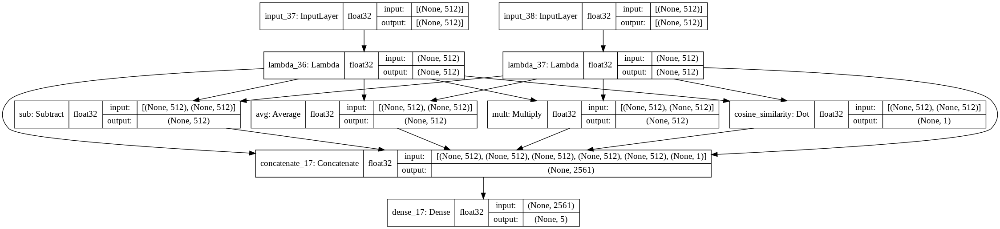

In [ ]:
tf.keras.utils.plot_model(
    model,
    to_file="Embed_baseline.png",
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
)

#Lime

In [ ]:
!pip install lime
from lime import lime_text
from lime.lime_text import LimeTextExplainer
class_names:List[str] = ["unrelated","duplicate","both","left","right"]
explainer = LimeTextExplainer(split_expression=u'(\W|空)+',class_names=class_names)

def split_list_using_seperator(s:str)-> numpy.ndarray:
  global separator
  splitted = s.split(separator)
  splitted = numpy.array(list(filter(lambda d: not d == "", splitted)))
  return splitted

def predict_concat_input(inp:List[str])-> numpy.ndarray:
  global model
  tmp = list(map(split_list_using_seperator, inp))
  inputs:numpy.ndarray = numpy.array(tmp)
  return model.predict([inputs[:,0], inputs[:,1]])#(batchVectorisation(inputs, vectoriser))#

def concat_inputs(inputs):
  global separator
  return separator.join(inputs)

separator:str = "空"
def string_to_array(string):
  return numpy.array([string])

def list_creator(array):
  return [string_to_array(array[0]), string_to_array(array[1])]#[vectoriser(string_to_array(array[0])), vectoriser(string_to_array(array[1]))]

In [ ]:
IMP_NUMBERS:List[int] = [[19,32], [34,48], [13,27], [22,30], [24,43]]
del X_train_list, X_test_list


def experimentForIdx(idx):
  global test_dev, model, explainer, class_names, y_dev_test_list
  model_input = concat_inputs(test_dev[idx,:])
  exp = explainer.explain_instance(model_input, predict_concat_input, num_samples=2500, num_features=10,labels=[0,1,2,3,4])
  gc.collect()
  print(f"True class: {class_names[y_dev_test_list[idx].argmax()]}")
  return exp

for cl in range(len(IMP_NUMBERS)):
  for i in range(len(IMP_NUMBERS[cl])):
    idx = IMP_NUMBERS[cl][i]
    exp = experimentForIdx(idx)
    exp.show_in_notebook(text=concat_inputs(test_dev[idx,:]), labels=(0,1,2,3,4))
    gc.collect()


True class: left


True class: left


True class: unrelated


True class: duplicate


True class: left


True class: unrelated


True class: both


True class: both


True class: both


True class: both


In [ ]:
#tf-idf 100000 1-2gram
models = numpy.array(["concat", "concat cosine", "all sum", "all sum sum"])
f1_scores = numpy.array([
                         [0.3942, 0.2262, 0.1344, 0.3309, 0.3161],
                         [0.4693, 0.3197, 0.1908, 0.3322, 0.3302],
                         [0.3947, 0.2374, 0.1447, 0.3988, 0.3432],
                         [0.4954, 0.2756, 0.1969, 0.406, 0.4333]
])
precission =  numpy.array([
                         [0.2791, 0.4167, 0.1848, 0.3932, 0.3289],
                         [0.3558, 0.4699, 0.2213, 0.3657, 0.3377],
                         [0.283, 0.4483, 0.2297, 0.4, 0.3662],
                         [0.3927, 0.4844, 0.2688, 0.3908, 0.392]
])
recall = numpy.array([
                      [0.6708, 0.1553, 0.1056, 0.2857, 0.3043],
                      [0.6894, 0.2422, 0.1677, 0.3043, 0.323],
                      [0.6522, 0.1615, 0.1056, 0.3975, 0.323],
                      [0.6708, 0.1925, 0.1553, 0.4224, 0.4845]
])

In [ ]:
#tf-idf
models = numpy.array(["all", "all cos", "all cos + l2","all sum", "all sum sum"])
f1_scores = numpy.array([
             [0.4511, 0.2044, 0.0676, 0.3314, 0.3846],
             [0.5207, 0.3059, 0.0995, 0.3402, 0.3955],
             [0.7218, 0.342, 0.094, 0.3796, 0.4056],
             [0.4421, 0.2165, 0.0788, 0.361, 0.3823],
             [0.5784, 0.3142, 0.1043, 0.4252, 0.4755]
])
precission =  numpy.array([
                      [0.343, 0.3594, 0.1522, 0.3115, 0.3448],
                      [0.4139, 0.4149, 0.1833, 0.3222, 0.3586],
                      [0.605, 0.4259, 0.1507, 0.349, 0.3711],
                      [0.3377, 0.3571, 0.1905, 0.3351, 0.345],
                      [0.512, 0.41, 0.22, 0.3682, 0.4071],
])
recall = numpy.array([
                      [0.6584, 0.1429, 0.0435, 0.354, 0.4348],
                      [0.7019, 0.2422, 0.0683, 0.3602, 0.441],
                      [0.8944, 0.2857, 0.0683, 0.4161, 0.4472],
                      [0.6398, 0.1553, 0.0497, 0.3913, 0.4286],
                      [0.6646, 0.2547, 0.0683, 0.5031, 0.5714]
])

In [ ]:
#normal
models = numpy.array(["baseline", "average", "mult","concat", "sub-mult", "CosConcat", "L2CosConcat", "iCosConcat", "L2Subtract", "logCosConcat", "uniCosConcat",
                      "sub-sum","mult-sum", "concat-sum", "sumSubMult", "sumCosConcat", "sumL2CosConcat", "sumICosConcat", "sumUniCosConcat","sumL2Concat",
                      "cosConcatSum", "dblSumConcat"])
f1_scores = numpy.array([
                         [0.3071, 0.2375, 0.2316, 0.2967, 0.3529],
              [0.4254, 0.1613, 0.2462, 0.2209, 0.2086],
              [0.7378, 0.3657, 0.2268, 0.2723, 0.2286],
              [0.6609, 0.2893, 0.1628, 0.4694, 0.51],
              [0.6396, 0.2805, 0.2433, 0.275, 0.3576],
              [0.5051, 0.2807, 0.2625, 0.3887, 0.3659],
              [0.6547, 0.2406, 0.094, 0.6316, 0.5991],
              [0.5799, 0.2811, 0.1761, 0.452, 0.4824],
              [0.3221, 0.2029, 0.1504, 0.5461, 0.5353],
              [0.6295, 0.4052, 0.2754, 0.2078, 0.0635],
              [0.6667, 0.3333, 0.1872, 0.4242, 0.4751],
              [0.2198, 0.2737, 0.1921, 0.4741, 0.1676], #sum
              [0.7289, 0.3102, 0.2459, 0.1168, 0.2515],
              [0.6224, 0.3041, 0.215, 0.4835, 0.2895],
              [0.6027, 0.2609, 0.2172, 0.3333, 0.3234],
              [0.6299, 0.2485, 0.1925, 0.4756, 0.4946],
              [0.6545, 0.237, 0.0952, 0.6344, 0.5974],
              [0.5923, 0.3077, 0.2201, 0.3924, 0.4024],
              [0.4615, 0.2105, 0.1358, 0.5112, 0.5192],
              [0.2857, 0.2105, 0.1085, 0.5575, 0.5396],
              [0.6502, 0.2945, 0.1929, 0.4725, 0.5029],
              [0.6172, 0.2796, 0.1436, 0.4624, 0.3576]
])
precission =  numpy.array([
  [0.2552, 0.2969, 0.234, 0.314, 0.3626],
         [0.3059, 0.3571, 0.2424, 0.2687, 0.2537],
         [0.6434, 0.4051, 0.2245, 0.2737, 0.2532],
         [0.562, 0.3651, 0.1842, 0.46, 0.4904],
         [0.5635, 0.3382, 0.1916, 0.3438, 0.4909],  
         [0.3773, 0.4776, 0.2642, 0.5581, 0.3593],
         [0.5748, 0.4324, 0.1321, 0.5455, 0.5191],
         [0.4509, 0.2921, 0.2222, 0.4938, 0.5541],
         [0.4528, 0.3333, 0.2703, 0.4229, 0.4162],
         [0.5097, 0.5439, 0.2111, 0.2759, 0.1333],
         [0.5603, 0.3718, 0.1776, 0.5072, 0.5059],
         [0.2326, 0.2766, 0.2099, 0.4044, 0.1807],
         [0.6357, 0.3187, 0.2027, 0.1951, 0.2958],
         [0.5172, 0.3467, 0.1949, 0.5116, 0.3929],
         [0.5366, 0.3231, 0.192, 0.3333, 0.3803],
         [0.5063, 0.2877, 0.1978, 0.5735, 0.5111],
         [0.5806, 0.4103, 0.1373, 0.5496, 0.5111],
         [0.4695, 0.3562, 0.2035, 0.5, 0.4853],
         [0.3913, 0.3784, 0.1667, 0.4488, 0.4821],
         [0.5135, 0.3784, 0.2121, 0.4188, 0.4121],
         [0.5374, 0.3582, 0.1881, 0.5, 0.557],
         [0.4938, 0.2889, 0.1529, 0.4778, 0.4909]
])
recall = numpy.array([
                [0.3854, 0.1979, 0.2292, 0.2812, 0.3438],
                 [0.6979, 0.1042, 0.25, 0.1875, 0.1771],
                 [0.8646, 0.3333, 0.2292, 0.2708, 0.2083],
                 [0.8021, 0.2396, 0.1458, 0.4792, 0.5312],
                 [0.7396, 0.2396, 0.3333, 0.2292, 0.2812],
                 [0.764, 0.1988, 0.2609, 0.2981, 0.3727],
                 [0.7604, 0.1667, 0.0729, 0.75, 0.7083],
                 [0.8125, 0.2708, 0.1458, 0.4167, 0.4271],
                 [0.25, 0.1458, 0.1042, 0.7708, 0.75],
                 [0.8229, 0.3229, 0.3958, 0.1667, 0.0417],
                 [0.8229, 0.3021, 0.1979, 0.3646, 0.4479],
                 [0.2083, 0.2708, 0.1771, 0.5729, 0.1562],
                 [0.8542, 0.3021, 0.3125, 0.0833, 0.2188],
                 [0.7812, 0.2708, 0.2396, 0.4583, 0.2292],
                 [0.6875, 0.2188, 0.25, 0.3333, 0.2812],
                 [0.8333, 0.2188, 0.1875, 0.4062, 0.4792],
                 [0.75, 0.1667, 0.0729, 0.75, 0.7188],
                 [0.8021, 0.2708, 0.2396, 0.3229, 0.3438],
                 [0.5625, 0.1458, 0.1146, 0.5938, 0.5625],
                 [0.1979, 0.1458, 0.0729, 0.8333, 0.7812],
                 [0.8229, 0.25, 0.1979, 0.4479, 0.4583],
                 [0.8229, 0.2708, 0.1354, 0.4479, 0.2812]
])

In [ ]:
#1-2gram
models = numpy.array(["avg", "mult", "baseline", "all", "all sum", "all sum sum", "avg sum", "mult sum", "sub sum"])
f1_scores = numpy.array([
             [0.3587,0.1397,0.2857, 0.1964, 0.0231],
             [0.3475, 0.2574, 0.0534, 0.2787, 0.0],
             [0.283, 0.189, 0.2197, 0.1842, 0.4584],
             [0.4016, 0.1758, 0.1843, 0.2443, 0.4954],
             [0.0523, 0.1229, 0.0, 0.3473, 0.0685],
             [0, 0.0222, 0.2322, 0.086, 0.5635],
             [0.3495, 0.1034, 0.2247, 0.0518, 0.0228],
             [0.0462, 0, 0.2881, 0.256, 0.0],
             [0.2307, 0.1878, 0.1619, 0.354, 0.517]
])
precission =  numpy.array([
                           [0.2409,0.52,0.2742, 0.2258, 0.1666],
                           [0.368, 0.1889, 0.1923, 0.2164, 0.0],
                           [0.2866, 0.228, 0.197, 0.1958, 0.4255],
                           [0.3028, 0.7619, 0.2045, 0.45, 0.3927],
                           [0.1666, 0.6111, 0.0, 0.2113, 0.4285],
                           [0, 0.1052, 0.1662, 0.32, 0.3281],
                           [0.2187, 0.6923, 0.2803, 0.1562, 0.1428],
                           [0.3333, 0, 0.187, 0.2094, 0],
                           [0.264, 0.1691, 0.2325, 0.375, 0.4257]
])
recall = numpy.array([
                      [0.7018, 0.0807, 0.2981, 0.1739, 0.0124],
                      [0.3291, 0.4037, 0.031, 0.3913, 0],
                      [0.2795, 0.1614, 0.2484, 0.1739, 0.4968],
                      [0.5962, 0.0993, 0.1677, 0.1677, 0.6708],
                      [0.031, 0.0683, 0.0, 9751, 0.0372],
                      [0, 0.0124, 0.385, 0.0496, 0.7888],
                      [0.8695, 0.0559, 0.1863, 0.031, 0.0124],
                      [0.0248, 0, 0.6273, 0.3291, 0.0],
                      [0.2049, 0.2111, 0.1242, 0.3354, 0.6583]
])

In [ ]:
models = numpy.array(["concat"])
f1_scores = numpy.array([
             [0.5663, 0.1687, 0.0602, 0.5181, 0.5663]
])
precission =  numpy.array([
                      [0.2866, 0.28, 0.1429, 0.5443, 0.5402]
])
recall = numpy.array([
                      [0.3806, 0.2105, 0.0847, 0.5309, 0.5529]
])

In [ ]:
#tf-idf   '=>', '<=', '<=>', 'unrelated', 'duplicate', 
labels = numpy.array(['unrelated', 'duplicate', '<=>', '<=', '=>'])
rearrange = numpy.array([4,3,2,0,1])
labels = labels[rearrange]
f1_scores = f1_scores[:,rearrange]
precission = precission[:, rearrange]
recall = recall[:, rearrange]
print(models)
print(f1_scores)
print("prec recall tabelle\t"+ "\t\t".join(labels))
for i in range(len(models)):
  output = models[i] + "\t\t"
  for j in range(len(labels)):
    output += f"& {precission[i][j]} & {recall[i][j]}"
  print(output + "\\\\")

['baseline' 'average' 'mult' 'concat' 'sub-mult' 'CosConcat' 'L2CosConcat'
 'iCosConcat' 'L2Subtract' 'logCosConcat' 'uniCosConcat' 'sub-sum'
 'mult-sum' 'concat-sum' 'sumSubMult' 'sumCosConcat' 'sumL2CosConcat'
 'sumICosConcat' 'sumUniCosConcat' 'sumL2Concat' 'cosConcatSum'
 'dblSumConcat']
[[0.3529 0.2967 0.2316 0.3071 0.2375]
 [0.2086 0.2209 0.2462 0.4254 0.1613]
 [0.2286 0.2723 0.2268 0.7378 0.3657]
 [0.51   0.4694 0.1628 0.6609 0.2893]
 [0.3576 0.275  0.2433 0.6396 0.2805]
 [0.3659 0.3887 0.2625 0.5051 0.2807]
 [0.5991 0.6316 0.094  0.6547 0.2406]
 [0.4824 0.452  0.1761 0.5799 0.2811]
 [0.5353 0.5461 0.1504 0.3221 0.2029]
 [0.0635 0.2078 0.2754 0.6295 0.4052]
 [0.4751 0.4242 0.1872 0.6667 0.3333]
 [0.1676 0.4741 0.1921 0.2198 0.2737]
 [0.2515 0.1168 0.2459 0.7289 0.3102]
 [0.2895 0.4835 0.215  0.6224 0.3041]
 [0.3234 0.3333 0.2172 0.6027 0.2609]
 [0.4946 0.4756 0.1925 0.6299 0.2485]
 [0.5974 0.6344 0.0952 0.6545 0.237 ]
 [0.4024 0.3924 0.2201 0.5923 0.3077]
 [0.5192 0.5112 0.1358 

In [ ]:
mod = [(11,0), (12,2), (13,3), (14,4), (15,5), (16,6), (17,7), (18,10), ]
for sum,normal in mod:
  print(f"{models[sum]} : {models[normal]}")
  print()


sub-sum : baseline
mult-sum : mult
concat-sum : concat
sumSubMult : sub-mult
sumCosConcat : CosConcat
sumL2CosConcat : L2CosConcat
sumICosConcat : iCosConcat
sumUniCosConcat : uniCosConcat


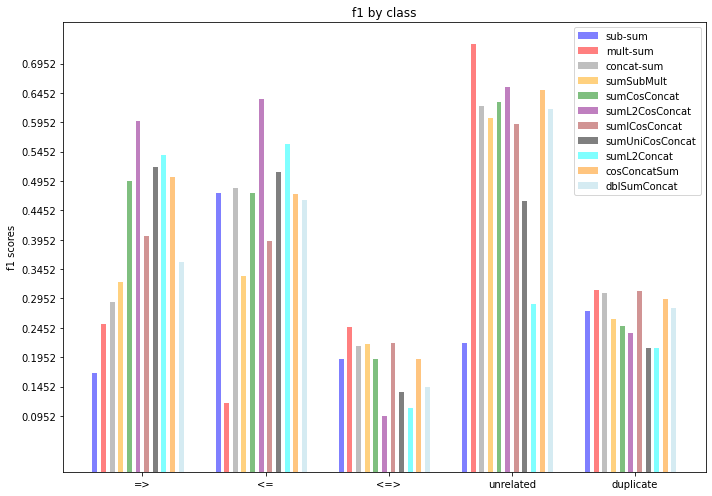

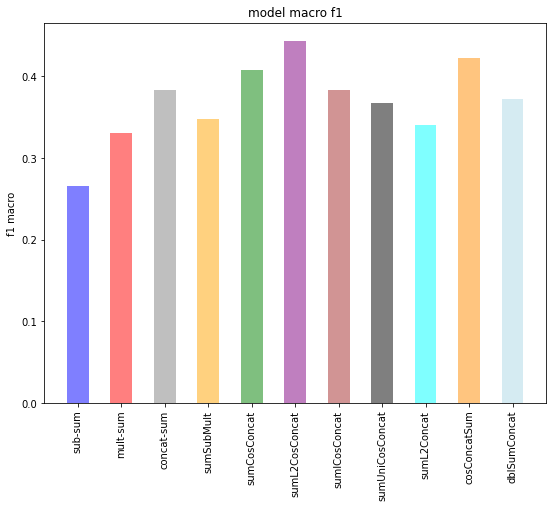

In [ ]:
#labels = ['=>', '<=', '<=>', 'unrelated', 'duplicate']
#models = numpy.array(["average", "multiplication", "baseline", "concat.", "sub-mult", 'CosConcat', 'L2CosConcat', 'uvCosConcat', "L2Subtract", "logCosConcat"])#, "baseline sum avg", "baseline sum mult", "baseline sum sub", "baseline sum", "baseline sum sum","baseline_cos_sum", "all_l2_cos"])
#f1_scores = [[0.1027289189,	0.1506117372,	0.1123073316,	0.3467901601,	0.1276076315],
#          [0.2694585232,	0.0453787234,	0.2112744322,	0.3854982506,	0.2342819444],
#          [0.2786108596,	0.3239465967,	0.1649468599,	0.1622632226,	0.1922534684],
#          [0.3941395554,	0.143250458,	0.171769554,	0.453555634,	0.2451779499],
#          [0.2527259175,	0.372824714,	0.06081962709,	0.453323779,	0.312732056],
#          [0.3887, 0.3659, 0.2625, 0.2807, 0.5051],
#          [0.6316, 0.5991, 0.094,  0.2406, 0.6547],
#          [0.452,  0.4824, 0.1761, 0.2811, 0.5799],
#          [0.5461, 0.5353, 0.1504, 0.2029, 0.3221],
#          [0.0635, 0.2078, 0.2754, 0.6295, 0.4052]
#          [0.01140927835,	0.06113211889,	0.3046452561,	0.342109379,	0.08407916411],
#          [0.276984835,	0,	0.2174756076,	0.5034676424,	0.3241059738],
#          [0.2610856269,	0.4953001042,	0.1864666845,	0.1762017167,	0.1538219566],
#          [0.1794403828,	0.4583053801,	0.2001802171,	0.4697525706,	0.2648139979],
#          [0.4126472084,	0.2794033174,	0.1824299844,	0.4743639479,	0.3183940678],
#          [0.3139, 0.14, 0.2058, 0.448, 0.2791],
#          [0.2283, 0.2054, 0.0667, 0.3558, 0.0698]
#]

#f1_scores = f1_scores[:6]
number = 11
models = models[number:]
precission = precission[number:]
recall = recall[number:]
f1_scores = f1_scores[number:]

color=["blue", 'red', 'gray', 'orange', 'green', 'purple', 'brown', 'black', 'cyan', 'darkorange', "lightblue"]

global_minimum = min(list(map(lambda x: min(x), f1_scores)))
global_maximum = max(list(map(lambda x: max(x), f1_scores)))

f1_mactro = numpy.array(list(map(sum, f1_scores)))/len(labels) #numpy.array(list(map(lambda x: sum(x),f1_scores)))
x = numpy.arange(len(labels))  # the label locations
width = 0.07  # the width of the bars
space = 0.03

fig, ax = plt.subplots(figsize=(10,7),)
for i in range(len(models)):
  offset_left:float = -len(models)*width/2 + width*i
  ax.bar(x + offset_left, f1_scores[i], label=models[i], width=width-space, alpha=0.5, color=color[i])

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('f1 scores')
ax.set_title('f1 by class')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_yticks(numpy.arange(global_minimum, global_maximum, 0.05))
ax.legend()
leg = ax.get_legend()
#for i in range(len(models)):
#  leg.legendHandles[i].set_color(color[i])
fig.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(9,7))
plt.bar(numpy.arange(len(f1_mactro)), f1_mactro, align='center', alpha=0.5, color=color, width=0.5)
plt.xticks(numpy.arange(len(models)), models, rotation='vertical')
plt.ylabel('f1 macro')
plt.title('model macro f1')
plt.show()

In [ ]:
from numpy import random
random_array = numpy.random.randint(0,5,2500)
zeros = numpy.zeros(500)
ones = numpy.ones(500)
twos = numpy.full(500, 2)
threes = numpy.full(500, 3)
fours = numpy.full(500, 4)
all = numpy.concatenate((zeros, ones, twos, threes, fours))
print(all.shape)

macro = sklearn.metrics.f1_score(y_true=all, y_pred=random_array, average="macro")
print(macro)

(2500,)
0.1860874117882009
